In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import plotly.graph_objects as go
import plotly.express as px


In [3]:
df = pd.read_csv('Superstore_data.csv',encoding='latin-1')

In [4]:
import os

In [5]:
df.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,...,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
0,1,CA-2016-152156,11/8/2016,11/11/2016,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,...,42420,South,FUR-BO-10001798,Furniture,Bookcases,Bush Somerset Collection Bookcase,261.9600,2,0.00,41.9136
1,2,CA-2016-152156,11/8/2016,11/11/2016,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,...,42420,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",731.9400,3,0.00,219.5820
2,3,CA-2016-138688,6/12/2016,6/16/2016,Second Class,DV-13045,Darrin Van Huff,Corporate,United States,Los Angeles,...,90036,West,OFF-LA-10000240,Office Supplies,Labels,Self-Adhesive Address Labels for Typewriters b...,14.6200,2,0.00,6.8714
3,4,US-2015-108966,10/11/2015,10/18/2015,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,...,33311,South,FUR-TA-10000577,Furniture,Tables,Bretford CR4500 Series Slim Rectangular Table,957.5775,5,0.45,-383.0310
4,5,US-2015-108966,10/11/2015,10/18/2015,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,...,33311,South,OFF-ST-10000760,Office Supplies,Storage,Eldon Fold 'N Roll Cart System,22.3680,2,0.20,2.5164


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9994 entries, 0 to 9993
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Row ID         9994 non-null   int64  
 1   Order ID       9994 non-null   object 
 2   Order Date     9994 non-null   object 
 3   Ship Date      9994 non-null   object 
 4   Ship Mode      9994 non-null   object 
 5   Customer ID    9994 non-null   object 
 6   Customer Name  9994 non-null   object 
 7   Segment        9994 non-null   object 
 8   Country        9994 non-null   object 
 9   City           9994 non-null   object 
 10  State          9994 non-null   object 
 11  Postal Code    9994 non-null   int64  
 12  Region         9994 non-null   object 
 13  Product ID     9994 non-null   object 
 14  Category       9994 non-null   object 
 15  Sub-Category   9994 non-null   object 
 16  Product Name   9994 non-null   object 
 17  Sales          9994 non-null   float64
 18  Quantity

In [7]:
df.describe()

,Row ID,Postal Code,Sales,Quantity,Discount,Profit
count,9994.000000,9994.000000,9994.000000,9994.000000,9994.000000,9994.000000
mean,4997.500000,55190.379428,229.858001,3.789574,0.156203,28.656896
std,2885.163629,32063.693350,623.245101,2.225110,0.206452,234.260108
min,1.000000,1040.000000,0.444000,1.000000,0.000000,-6599.978000
25%,2499.250000,23223.000000,17.280000,2.000000,0.000000,1.728750
50%,4997.500000,56430.500000,54.490000,3.000000,0.200000,8.666500
75%,7495.750000,90008.000000,209.940000,5.000000,0.200000,29.364000
max,9994.000000,99301.000000,22638.480000,14.000000,0.800000,8399.976000


In [8]:
df.columns

Index(['Row ID', 'Order ID', 'Order Date', 'Ship Date', 'Ship Mode',
       'Customer ID', 'Customer Name', 'Segment', 'Country', 'City', 'State',
       'Postal Code', 'Region', 'Product ID', 'Category', 'Sub-Category',
       'Product Name', 'Sales', 'Quantity', 'Discount', 'Profit'],
      dtype='object')

In [9]:
df.isnull().sum()

Row ID           0
Order ID         0
Order Date       0
Ship Date        0
Ship Mode        0
Customer ID      0
Customer Name    0
Segment          0
Country          0
City             0
State            0
Postal Code      0
Region           0
Product ID       0
Category         0
Sub-Category     0
Product Name     0
Sales            0
Quantity         0
Discount         0
Profit           0
dtype: int64

In [10]:
#df['Order Date'] = pd.to_datetime(df['Order Date'])
#df['Ship Date'] = pd.to_datetime(df['Ship Date'])

date_columns = ['Order Date', 'Ship Date']

# Convert the specified columns to datetime
df[date_columns] = df[date_columns].apply(pd.to_datetime)

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9994 entries, 0 to 9993
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Row ID         9994 non-null   int64         
 1   Order ID       9994 non-null   object        
 2   Order Date     9994 non-null   datetime64[ns]
 3   Ship Date      9994 non-null   datetime64[ns]
 4   Ship Mode      9994 non-null   object        
 5   Customer ID    9994 non-null   object        
 6   Customer Name  9994 non-null   object        
 7   Segment        9994 non-null   object        
 8   Country        9994 non-null   object        
 9   City           9994 non-null   object        
 10  State          9994 non-null   object        
 11  Postal Code    9994 non-null   int64         
 12  Region         9994 non-null   object        
 13  Product ID     9994 non-null   object        
 14  Category       9994 non-null   object        
 15  Sub-Category   9994 n

In [12]:
df.describe(include="object").T

,count,unique,top,freq
Order ID,9994,5009,CA-2017-100111,14
Ship Mode,9994,4,Standard Class,5968
Customer ID,9994,793,WB-21850,37
Customer Name,9994,793,William Brown,37
Segment,9994,3,Consumer,5191
Country,9994,1,United States,9994
City,9994,531,New York City,915
State,9994,49,California,2001
Region,9994,4,West,3203
Product ID,9994,1862,OFF-PA-10001970,19


In [13]:
#create a new feature to count no of days taken to ship an order
df['days_to_ship'] = df['Ship Date'] - df['Order Date']

In [14]:
df[['days_to_ship']].head(10)

,days_to_ship
0,3 days
1,3 days
2,4 days
3,7 days
4,7 days
5,5 days
6,5 days
7,5 days
8,5 days
9,5 days


In [15]:
# Add new columns year, month and day
df["order_year"]  = df["Order Date"].dt.year
df["order_month"] = df["Order Date"].dt.month_name()
df["order_day"]   = df["Order Date"].dt.day_name()

In [16]:
df.columns

Index(['Row ID', 'Order ID', 'Order Date', 'Ship Date', 'Ship Mode',
       'Customer ID', 'Customer Name', 'Segment', 'Country', 'City', 'State',
       'Postal Code', 'Region', 'Product ID', 'Category', 'Sub-Category',
       'Product Name', 'Sales', 'Quantity', 'Discount', 'Profit',
       'days_to_ship', 'order_year', 'order_month', 'order_day'],
      dtype='object')

In [17]:
#Check unique customer names and ids
print("Unique Customer ID's:", df['Customer ID'].nunique())
print("Unique Customer Name:", df['Customer ID'].nunique())
#Remove Customer names

Unique Customer ID's: 793
Unique Customer Name: 793


In [18]:
print("Unique Postal Code:", df['Postal Code'].nunique())
print("Unique City:", df['City'].nunique())

Unique Postal Code: 631
Unique City: 531


In [19]:
#Remove postal codes since each city has many postal codes

In [20]:
print("Unique Countries:", df['Country'].nunique())
print("Unique State:", df['State'].nunique())

Unique Countries: 1
Unique State: 49


In [21]:
df['Country'].unique()

array(['United States'], dtype=object)

In [22]:

#data contains only one country
#1:1 relationshop of product ID and product name
print("Unique Product ID's:", df['Product ID'].nunique())
print("Unique Product names:", df['Product Name'].nunique())

Unique Product ID's: 1862
Unique Product names: 1850


In [23]:
#Drop product Id, country, postal code, customer name, row ID
df.drop(columns = ['Row ID', 'Product ID', 'Country', 'Postal Code', 'Customer Name'], axis=1, inplace = True)

In [24]:
df.columns

Index(['Order ID', 'Order Date', 'Ship Date', 'Ship Mode', 'Customer ID',
       'Segment', 'City', 'State', 'Region', 'Category', 'Sub-Category',
       'Product Name', 'Sales', 'Quantity', 'Discount', 'Profit',
       'days_to_ship', 'order_year', 'order_month', 'order_day'],
      dtype='object')

## EDA

In [25]:
total_orders = df.shape[0]

print(f"Total orders: {total_orders}")

Total orders: 9994


In [26]:
unique_orders = df['Order ID'].nunique()
print(f"Unique orders: {unique_orders}")

Unique orders: 5009


In [27]:
df['order_year'].unique()

array([2016, 2015, 2014, 2017], dtype=int64)

In [28]:
# Group by the 'order_year' and count the number of occurrences (number of orders)
orders_per_year = df.groupby('order_year').size()

fig = go.Figure()

# Add a trace to the figure
fig.add_trace(go.Scatter(
    x=orders_per_year.index,
    y=orders_per_year.values,
    mode='lines+markers',
    marker=dict(color='skyblue', size=10),
    line=dict(color='skyblue'),
    name='Orders'
))

# Customize the layout
fig.update_layout(
    title='Number of Orders Placed Each Year',
    xaxis_title='Year',
    yaxis_title='Number of Orders',
    xaxis=dict(tickmode='linear'),
    template='plotly_white',
    height=600,
    width=1000
)

# Show the plot
fig.show()

In [29]:
# Group by 'State' and count the number of orders placed in each state

orders_per_state = df.groupby('State').size().reset_index(name='Number of Orders')

# Sort the DataFrame by 'Number of Orders' in descending order
orders_per_state = orders_per_state.sort_values(by='Number of Orders', ascending=False)

# Create a bar chart using Plotly
fig = px.bar(orders_per_state, x='State', y='Number of Orders', 
             title='Number of Orders Placed in Each State',
             labels={'State': 'State', 'Number of Orders': 'Number of Orders'},
             color='Number of Orders')

# Show the plot
fig.show()

In [30]:
# Ensure the order of months from Jan to Dec
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 
               'July', 'August', 'September', 'October', 'November', 'December']

# Group by 'order_month' and count the number of orders in each month across all years
orders_per_month = df.groupby('order_month').size().reset_index(name='Number of Orders')

# Set the correct categorical order for the 'order_month' column
orders_per_month['order_month'] = pd.Categorical(orders_per_month['order_month'], categories=month_order, ordered=True)

# Sort by the ordered month names
orders_per_month = orders_per_month.sort_values('order_month')

# Create a line chart to visualize the number of orders for each month
fig = px.line(orders_per_month, 
              x='order_month', 
              y='Number of Orders', 
              title='Number of Orders in Each Month (Collectively for All Years)',
              labels={'order_month': 'Month', 'Number of Orders': 'Number of Orders'})

# Customize the plot
fig.update_traces(mode='lines+markers')  # Add markers to the line plot

# Show the plot
fig.show()

In [31]:
# Define the correct order of months
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 
               'July', 'August', 'September', 'October', 'November', 'December']

# Group by 'order_year' and 'order_month' and count the number of orders
orders_per_month_year = df.groupby(['order_year', 'order_month']).size().reset_index(name='Number of Orders')

# Ensure the 'order_month' column is ordered according to the chronological order of months
orders_per_month_year['order_month'] = pd.Categorical(orders_per_month_year['order_month'], 
                                                      categories=month_order, 
                                                      ordered=True)
orders_per_month_year = orders_per_month_year.sort_values('order_month')

# Create a line chart with multiple lines for each year
fig = px.line(orders_per_month_year, 
              x='order_month', 
              y='Number of Orders', 
              color='order_year',
              title='Number of Orders in Each Month (Segregated by Year)',
              labels={'order_month': 'Month', 'Number of Orders': 'Number of Orders', 'order_year': 'Year'})

# Customize the plot
fig.update_traces(mode='lines+markers')  # Add markers to the line plot

# Show the plot
fig.show()

In [32]:
# Extract the day number from 'Order Date'
df['order_day_number'] = df['Order Date'].dt.day

# Display the DataFrame with the new column
df[['Order Date', 'order_day_number']].head()

,Order Date,order_day_number
0,2016-11-08,8
1,2016-11-08,8
2,2016-06-12,12
3,2015-10-11,11
4,2015-10-11,11


In [33]:
# Group by 'order_day_number' and count the number of orders in each month across all years
orders_per_day = df.groupby('order_day_number').size().reset_index(name='Number of Orders')

# Set the correct categorical order for the 'order_day_number' column
orders_per_day['order_day_number'] = pd.Categorical(orders_per_day['order_day_number'])

# Sort by the ordered day names
orders_per_day = orders_per_day.sort_values('order_day_number')

# Create a line chart to visualize the number of orders for each month
fig = px.line(orders_per_day, 
              x='order_day_number', 
              y='Number of Orders', 
              title='Number of Orders by Day (Collectively for All Years)',
              labels={'order_day_number': 'Day', 'Number of Orders': 'Number of Orders'})

# Customize the plot
fig.update_traces(mode='lines+markers')  # Add markers to the line plot

# Show the plot
fig.show()

In [34]:
days_of_the_week = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 
               'Sunday']

# Group by 'order_year' and 'order_day' and count the number of orders
orders_per_dow = df.groupby(['order_day']).size().reset_index(name='Number of Orders')

# Ensure the 'order_day' column is ordered according to the chronological order of months
orders_per_dow['order_day'] = pd.Categorical(orders_per_dow['order_day'], 
                                                      categories=days_of_the_week, 
                                                      ordered=True)
orders_per_dow = orders_per_dow.sort_values('order_day')

# Create a line chart to visualize the number of orders for each month
fig = px.line(orders_per_dow, 
              x='order_day', 
              y='Number of Orders', 
              title='Number of Orders in Each Day (Collectively for All Years)',
              labels={'order_day': 'Day', 'Number of Orders': 'Number of Orders'})

# Customize the plot
fig.update_traces(mode='lines+markers')  # Add markers to the line plot

# Show the plot
fig.show()

In [35]:
total_sales = df['Sales'].sum()
print(total_sales)

2297200.8603000003


In [36]:
# Group by 'order_year' and sum the 'Sales'
sales_per_year = df.groupby('order_year')['Sales'].sum().reset_index()

# Create a line chart to visualize sales for each year
fig = px.line(sales_per_year, 
              x='order_year', 
              y='Sales', 
              title='Total Sales Each Year',
              labels={'order_year': 'Year', 'Sales': 'Total Sales'},
              markers=True)

# Show the plot
fig.show()

In [37]:
sales_per_year

,order_year,Sales
0,2014,484247.4981
1,2015,470532.5090
2,2016,609205.5980
3,2017,733215.2552


In [38]:
sales_per_year['Sales'].sum()

2297200.8603

In [39]:
df.columns

Index(['Order ID', 'Order Date', 'Ship Date', 'Ship Mode', 'Customer ID',
       'Segment', 'City', 'State', 'Region', 'Category', 'Sub-Category',
       'Product Name', 'Sales', 'Quantity', 'Discount', 'Profit',
       'days_to_ship', 'order_year', 'order_month', 'order_day',
       'order_day_number'],
      dtype='object')

In [40]:
# Define the correct order of months
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 
               'July', 'August', 'September', 'October', 'November', 'December']

# Group by 'order_year' and 'order_month', and sum the 'Sales'
sales_per_month_year = df.groupby(['order_year', 'order_month'])['Sales'].sum().reset_index()

# Ensure the 'order_month' column is ordered according to the chronological order of months
sales_per_month_year['order_month'] = pd.Categorical(sales_per_month_year['order_month'], 
                                                      categories=month_order, 
                                                      ordered=True)
sales_per_month_year = sales_per_month_year.sort_values('order_month')

# Create a line chart with multiple lines for each year
fig = px.line(sales_per_month_year, 
              x='order_month', 
              y='Sales', 
              color='order_year',
              title='Sales by Month for Each Year',
              labels={'order_month': 'Month', 'Sales': 'Total Sales', 'order_year': 'Year'},
              markers=True)

# Show the plot
fig.show()

In [41]:
# Define a dictionary to map state names to their abbreviations
state_abbreviation_map = {
    'Alabama': 'AL', 'Alaska': 'AK', 'Arizona': 'AZ', 'Arkansas': 'AR', 'California': 'CA', 'Colorado': 'CO', 
    'Connecticut': 'CT', 'Delaware': 'DE', 'District of Columbia': 'DC', 'Florida': 'FL', 'Georgia': 'GA', 
    'Hawaii': 'HI', 'Idaho': 'ID', 'Illinois': 'IL', 'Indiana': 'IN', 'Iowa': 'IA', 'Kansas': 'KS', 
    'Kentucky': 'KY', 'Louisiana': 'LA', 'Maine': 'ME', 'Maryland': 'MD', 'Massachusetts': 'MA', 'Michigan': 'MI', 
    'Minnesota': 'MN', 'Mississippi': 'MS', 'Missouri': 'MO', 'Montana': 'MT', 'Nebraska': 'NE', 'Nevada': 'NV', 
    'New Hampshire': 'NH', 'New Jersey': 'NJ', 'New Mexico': 'NM', 'New York': 'NY', 'North Carolina': 'NC', 
    'North Dakota': 'ND', 'Ohio': 'OH', 'Oklahoma': 'OK', 'Oregon': 'OR', 'Pennsylvania': 'PA', 'Rhode Island': 'RI', 
    'South Carolina': 'SC', 'South Dakota': 'SD', 'Tennessee': 'TN', 'Texas': 'TX', 'Utah': 'UT', 
    'Vermont': 'VT', 'Virginia': 'VA', 'Washington': 'WA', 'West Virginia': 'WV', 'Wisconsin': 'WI', 'Wyoming': 'WY'
}

# Group by 'State' and sum the 'Sales'
sales_per_state = df.groupby('State')['Sales'].sum().reset_index()

# Map full state names to their abbreviations
sales_per_state['State'] = sales_per_state['State'].map(state_abbreviation_map)

# Create a choropleth map to visualize sales by state in the USA
fig = px.choropleth(sales_per_state, 
                    locations='State', 
                    locationmode='USA-states', 
                    color='Sales', 
                    scope="usa",
                    title='Total Sales by State in the USA',
                    labels={'Sales': 'Total Sales'})

# Show the plot
fig.show()

In [42]:
# Group by 'State' and sum the 'Sales'
sales_per_state = df.groupby('State')['Sales'].sum().reset_index()

# Sort the data in ascending order of sales
sales_per_state = sales_per_state.sort_values(by='Sales', ascending=False)

# Create a bar chart with different colors for each state and sorted in ascending order
fig = px.bar(sales_per_state, 
             x='State', 
             y='Sales', 
             title='Total Sales by State (Ascending Order)',
             labels={'State': 'State', 'Sales': 'Total Sales'},
             color='State',  # Assign a different color to each state
             color_discrete_sequence=px.colors.qualitative.Alphabet)  # Use a predefined color sequence

# Show the plot
fig.show()


In [43]:
# Group by 'Region' and sum the 'Sales'
sales_per_region = df.groupby('Region')['Sales'].sum().reset_index()

# Sort the data in ascending order of sales (optional)
sales_per_region = sales_per_region.sort_values(by='Sales', ascending=False)

# Create a bar chart to visualize sales by region
fig = px.bar(sales_per_region, 
             x='Region', 
             y='Sales', 
             title='Total Sales by Region',
             labels={'Region': 'Region', 'Sales': 'Total Sales'},
             color='Region',  # Assign a different color to each region
             color_discrete_sequence=px.colors.qualitative.Set2)  # Use a predefined color sequence

# Show the plot
fig.show()

In [44]:
# Group by 'Category' and sum the 'Sales'
sales_per_category = df.groupby('Category')['Sales'].sum().reset_index()

# Sort the data in ascending order of sales (optional)
sales_per_category = sales_per_category.sort_values(by='Sales', ascending=False)

# Create a bar chart to visualize sales by Category
fig = px.bar(sales_per_category, 
             x='Category', 
             y='Sales', 
             title='Total Sales by Category',
             labels={'Category': 'Category', 'Sales': 'Total Sales'},
             color='Category',  # Assign a different color to each region
             color_discrete_sequence=px.colors.qualitative.Set2)  # Use a predefined color sequence

# Show the plot
fig.show()

In [45]:
fig = px.treemap(df, 
                 path=['Category', 'Sub-Category'], 
                 values='Sales', 
                 title='Treemap of Sales by Category and Sub-Category')

# Show the treemap
fig.show()

C:\Users\asus\anaconda3\lib\site-packages\plotly\express\_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\asus\anaconda3\lib\site-packages\plotly\express\_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [46]:
sales_per_ship_mode = df.groupby('Ship Mode')['Sales'].sum().reset_index()

fig = px.bar(sales_per_ship_mode, 
             x='Ship Mode', 
             y='Sales', 
             title='Total Sales by Shipping Mode',
             labels={'Ship Mode': 'Shipping Mode', 'Sales': 'Total Sales'})

fig.show()

In [47]:
sales_quantity_per_category = df.groupby('Category').agg({'Sales': 'sum', 'Quantity': 'sum'}).reset_index()

# Normalize the sales and quantity values
sales_quantity_per_category['Sales_normalized'] = sales_quantity_per_category['Sales'] / sales_quantity_per_category['Sales'].max()
sales_quantity_per_category['Quantity_normalized'] = sales_quantity_per_category['Quantity'] / sales_quantity_per_category['Quantity'].max()

# Create a side-by-side bar chart with normalized values
fig = px.bar(sales_quantity_per_category, 
             x='Category', 
             y=['Sales_normalized', 'Quantity_normalized'], 
             title='Normalized Sales and Quantity by Category (Side-by-Side)',
             labels={'value': 'Normalized Total', 'variable': 'Metric'},
             barmode='group')

# Show the plot
fig.show()

In [48]:
df['Category'].nunique()

3

In [49]:
df['Category'].value_counts()

Office Supplies    6026
Furniture          2121
Technology         1847
Name: Category, dtype: int64

In [50]:
total_items_sold = df['Quantity'].sum()
print(total_items_sold)

37873


In [51]:
# Group by 'Product Name' and sum the 'Quantity', then sort and select top 10
top_10_products = df.groupby('Product Name')['Quantity'].sum().reset_index().sort_values(by='Quantity', ascending=False).head(10)

# Create a bar chart to visualize the top 10 products by quantity sold
fig = px.bar(top_10_products, 
             x='Product Name', 
             y='Quantity', 
             title='Top 10 Products by Quantity Sold',
             labels={'Product Name': 'Product Name', 'Quantity': 'Total Quantity'})

# Show the plot
fig.show()

In [52]:
# Group by 'Category' and sum the 'Quantity'
quantity_per_category = df.groupby('Category')['Quantity'].sum().reset_index().sort_values(by='Quantity', ascending=False)

# Create a bar chart to visualize quantity sold by category
fig = px.bar(quantity_per_category, 
             x='Category', 
             y='Quantity', 
             title='Total Quantity Sold by Category',
             labels={'Category': 'Category', 'Quantity': 'Total Quantity'})

# Show the plot
fig.show()

In [53]:
# Group by 'Sub-Category' and sum the 'Quantity'
quantity_per_subcategory = df.groupby('Sub-Category')['Quantity'].sum().reset_index().sort_values(by='Quantity', ascending=False)

# Create a bar chart to visualize quantity sold by sub-category
fig = px.bar(quantity_per_subcategory, 
             x='Sub-Category', 
             y='Quantity', 
             title='Total Quantity Sold by Sub-Category',
             labels={'Sub-Category': 'Sub-Category', 'Quantity': 'Total Quantity'})

# Show the plot
fig.show()


In [54]:
# Group by 'Region' and sum the 'Quantity'
quantity_per_region = df.groupby('Region')['Quantity'].sum().reset_index().sort_values(by='Quantity', ascending=False)

# Create a bar chart to visualize quantity sold by region
fig = px.bar(quantity_per_region, 
             x='Region', 
             y='Quantity', 
             title='Total Quantity Sold by Region',
             labels={'Region': 'Region', 'Quantity': 'Total Quantity'})

# Show the plot
fig.show()

In [55]:
# Define a dictionary to map state names to their abbreviations
state_abbreviation_map = {
    'Alabama': 'AL', 'Alaska': 'AK', 'Arizona': 'AZ', 'Arkansas': 'AR', 'California': 'CA', 'Colorado': 'CO', 
    'Connecticut': 'CT', 'Delaware': 'DE', 'District of Columbia': 'DC', 'Florida': 'FL', 'Georgia': 'GA', 
    'Hawaii': 'HI', 'Idaho': 'ID', 'Illinois': 'IL', 'Indiana': 'IN', 'Iowa': 'IA', 'Kansas': 'KS', 
    'Kentucky': 'KY', 'Louisiana': 'LA', 'Maine': 'ME', 'Maryland': 'MD', 'Massachusetts': 'MA', 'Michigan': 'MI', 
    'Minnesota': 'MN', 'Mississippi': 'MS', 'Missouri': 'MO', 'Montana': 'MT', 'Nebraska': 'NE', 'Nevada': 'NV', 
    'New Hampshire': 'NH', 'New Jersey': 'NJ', 'New Mexico': 'NM', 'New York': 'NY', 'North Carolina': 'NC', 
    'North Dakota': 'ND', 'Ohio': 'OH', 'Oklahoma': 'OK', 'Oregon': 'OR', 'Pennsylvania': 'PA', 'Rhode Island': 'RI', 
    'South Carolina': 'SC', 'South Dakota': 'SD', 'Tennessee': 'TN', 'Texas': 'TX', 'Utah': 'UT', 
    'Vermont': 'VT', 'Virginia': 'VA', 'Washington': 'WA', 'West Virginia': 'WV', 'Wisconsin': 'WI', 'Wyoming': 'WY'
}

# Group by 'State' and sum the 'Quantity'
quantity_per_state = df.groupby('State')['Quantity'].sum().reset_index()

quantity_per_state['State'] = quantity_per_state['State'].map(state_abbreviation_map)


# Create a choropleth map to visualize quantity sold by state in the USA
fig = px.choropleth(quantity_per_state, 
                    locations='State', 
                    locationmode='USA-states', 
                    color='Quantity', 
                    scope="usa",
                    title='Total Quantity Sold by State in the USA',
                    labels={'Quantity': 'Total Quantity'})

# Show the plot
fig.show()

In [56]:
# Group by 'Ship Mode' and sum the 'Quantity'
quantity_per_ship_mode = df.groupby('Ship Mode')['Quantity'].sum().reset_index().sort_values(by='Quantity', ascending=False)

# Create a bar chart to visualize quantity sold by ship mode
fig = px.bar(quantity_per_ship_mode, 
             x='Ship Mode', 
             y='Quantity', 
             title='Total Quantity Sold by Ship Mode',
             labels={'Ship Mode': 'Ship Mode', 'Quantity': 'Total Quantity'})

# Show the plot
fig.show()

In [57]:

# Group by 'order_year' and 'order_month' and sum the 'Quantity'
quantity_over_time = df.groupby(['order_year', 'order_month'])['Quantity'].sum().reset_index(name='Number of Quantity')

# Ensure the order of months from January to December
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
quantity_over_time['order_month'] = pd.Categorical(quantity_over_time['order_month'], categories=month_order, ordered=True)

quantity_over_time = quantity_over_time.sort_values('order_month')

# Create a line chart to visualize quantity sold over time
fig = px.line(quantity_over_time, 
              x='order_month', 
              y='Number of Quantity', 
              color='order_year',
              title='Total Quantity Sold Over Time',
              labels={'order_month': 'Month', 'Quantity': 'Total Quantity', 'order_year': 'Year'})

fig.update_traces(mode='lines+markers')  # Add markers to the line plot


# Show the plot
fig.show()

In [58]:
# Create a scatter plot to visualize quantity vs sales
fig = px.scatter(df, 
                 x='Quantity', 
                 y='Sales', 
                 title='Quantity vs Sales',
                 labels={'Quantity': 'Quantity Sold', 'Sales': 'Total Sales'})

# Show the plot
fig.show()

In [59]:
import plotly.express as px

# Create a pivot table for categories and regions
quantity_pivot = df.pivot_table(index='Category', columns='Region', values='Quantity', aggfunc='sum')

# Create the heatmap
fig = px.imshow(quantity_pivot, 
                labels=dict(x="Region", y="Category", color="Quantity Sold"), 
                title='Quantity Sold by Category and Region')

# Show the heatmap
fig.show()

In [60]:
fig = px.treemap(df, 
                 path=['Category', 'Sub-Category'], 
                 values='Quantity', 
                 title='Treemap of Quantity Sold by Category and Sub-Category')

# Show the treemap
fig.show()

C:\Users\asus\anaconda3\lib\site-packages\plotly\express\_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\asus\anaconda3\lib\site-packages\plotly\express\_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [61]:
fig = px.box(df, 
             x='Ship Mode', 
             y='Quantity', 
             title='Distribution of Quantity Sold by Ship Mode',
             labels={'Quantity': 'Quantity Sold', 'Ship Mode': 'Shipping Mode'})

# Show the box plot
fig.show()

In [62]:
fig = px.violin(df, 
                x='Category', 
                y='Quantity', 
                title='Violin Plot of Quantity Sold by Category',
                box=True,  # Adds a box plot inside the violin plot
                points='all')  # Shows all the points

# Show the violin plot
fig.show()

In [63]:
fig = px.pie(df, 
             names='Category', 
             values='Quantity', 
             title='Proportion of Quantity Sold by Category')

# Show the pie chart
fig.show()

In [64]:
fig = px.pie(df, 
             names='Region', 
             values='Quantity', 
             hole=0.3,  # Creates the hole for the donut chart
             title='Proportion of Quantity Sold by Region')

# Show the donut chart
fig.show()

In [65]:
fig = px.histogram(df, 
                   x='Quantity', 
                   nbins=20, 
                   title='Distribution of Quantity Sold per Order')

# Show the histogram
fig.show()


In [66]:
# Ensure the order of months from January to December
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
profit_over_time = df.groupby(['order_year', 'order_month'])['Profit'].sum().reset_index()
profit_over_time['order_month'] = pd.Categorical(profit_over_time['order_month'], categories=month_order, ordered=True)

profit_over_time = profit_over_time.sort_values('order_month')
fig = px.line(profit_over_time, 
              x='order_month', 
              y='Profit', 
              color='order_year',
              title='Profit Over Time by Year',
              labels={'order_month': 'Month', 'Profit': 'Total Profit', 'order_year': 'Year'})

fig.show()

In [67]:
profit_per_category = df.groupby('Category')['Profit'].sum().reset_index()

fig = px.bar(profit_per_category, 
             x='Category', 
             y='Profit', 
             title='Total Profit by Category',
             labels={'Category': 'Category', 'Profit': 'Total Profit'})

fig.show()

In [68]:
df.head()


,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Segment,City,State,Region,Category,...,Product Name,Sales,Quantity,Discount,Profit,days_to_ship,order_year,order_month,order_day,order_day_number
0,CA-2016-152156,2016-11-08,2016-11-11,Second Class,CG-12520,Consumer,Henderson,Kentucky,South,Furniture,...,Bush Somerset Collection Bookcase,261.9600,2,0.00,41.9136,3 days,2016,November,Tuesday,8
1,CA-2016-152156,2016-11-08,2016-11-11,Second Class,CG-12520,Consumer,Henderson,Kentucky,South,Furniture,...,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",731.9400,3,0.00,219.5820,3 days,2016,November,Tuesday,8
2,CA-2016-138688,2016-06-12,2016-06-16,Second Class,DV-13045,Corporate,Los Angeles,California,West,Office Supplies,...,Self-Adhesive Address Labels for Typewriters b...,14.6200,2,0.00,6.8714,4 days,2016,June,Sunday,12
3,US-2015-108966,2015-10-11,2015-10-18,Standard Class,SO-20335,Consumer,Fort Lauderdale,Florida,South,Furniture,...,Bretford CR4500 Series Slim Rectangular Table,957.5775,5,0.45,-383.0310,7 days,2015,October,Sunday,11
4,US-2015-108966,2015-10-11,2015-10-18,Standard Class,SO-20335,Consumer,Fort Lauderdale,Florida,South,Office Supplies,...,Eldon Fold 'N Roll Cart System,22.3680,2,0.20,2.5164,7 days,2015,October,Sunday,11


In [69]:
# Ensure state abbreviations are used, if necessary
state_abbreviation_map = {
    'Alabama': 'AL', 'Alaska': 'AK', 'Arizona': 'AZ', 'Arkansas': 'AR', 'California': 'CA', 'Colorado': 'CO', 
    'Connecticut': 'CT', 'Delaware': 'DE', 'District of Columbia': 'DC', 'Florida': 'FL', 'Georgia': 'GA', 
    'Hawaii': 'HI', 'Idaho': 'ID', 'Illinois': 'IL', 'Indiana': 'IN', 'Iowa': 'IA', 'Kansas': 'KS', 
    'Kentucky': 'KY', 'Louisiana': 'LA', 'Maine': 'ME', 'Maryland': 'MD', 'Massachusetts': 'MA', 'Michigan': 'MI', 
    'Minnesota': 'MN', 'Mississippi': 'MS', 'Missouri': 'MO', 'Montana': 'MT', 'Nebraska': 'NE', 'Nevada': 'NV', 
    'New Hampshire': 'NH', 'New Jersey': 'NJ', 'New Mexico': 'NM', 'New York': 'NY', 'North Carolina': 'NC', 
    'North Dakota': 'ND', 'Ohio': 'OH', 'Oklahoma': 'OK', 'Oregon': 'OR', 'Pennsylvania': 'PA', 'Rhode Island': 'RI', 
    'South Carolina': 'SC', 'South Dakota': 'SD', 'Tennessee': 'TN', 'Texas': 'TX', 'Utah': 'UT', 
    'Vermont': 'VT', 'Virginia': 'VA', 'Washington': 'WA', 'West Virginia': 'WV', 'Wisconsin': 'WI', 'Wyoming': 'WY'
}

# Map full state names to abbreviations if necessary
profit_per_state = df.groupby('State')['Profit'].sum().reset_index()

profit_per_state['State'] = profit_per_state['State'].map(state_abbreviation_map)


# Create a choropleth map for profit by state
# Create a choropleth map to visualize quantity sold by state in the USA
fig = px.choropleth(profit_per_state, 
                    locations='State', 
                    locationmode='USA-states', 
                    color='Profit', 
                    scope="usa",
                    title='Total Profit by State in the USA',
                    labels={'profit': 'Profit'})

# Show the plot
fig.show()


In [70]:
profit_per_region = df.groupby('Region')['Profit'].sum().reset_index()

fig = px.bar(profit_per_region, 
             x='Region', 
             y='Profit', 
             title='Total Profit by Region',
             labels={'Region': 'Region', 'Profit': 'Total Profit'})

fig.show()

In [71]:
profit_per_segment = df.groupby('Segment')['Profit'].sum().reset_index()

fig = px.bar(profit_per_segment, 
             x='Segment', 
             y='Profit', 
             title='Total Profit by Customer Segment',
             labels={'Segment': 'Customer Segment', 'Profit': 'Total Profit'})

fig.show()

In [72]:
top_products_by_profit = df.groupby('Product Name')['Profit'].sum().reset_index().sort_values(by='Profit', ascending=False).head(10)

fig = px.bar(top_products_by_profit, 
             x='Product Name', 
             y='Profit', 
             title='Top 10 Products by Profit',
             labels={'Product Name': 'Product', 'Profit': 'Total Profit'})

fig.show()

In [73]:
fig = px.scatter(df, 
                 x='Sales', 
                 y='Profit', 
                 color='Category', 
                 title='Profit vs Sales',
                 labels={'Sales': 'Total Sales', 'Profit': 'Total Profit'})

fig.show()


In [74]:
profit_per_ship_mode = df.groupby('Ship Mode')['Profit'].sum().reset_index()

fig = px.bar(profit_per_ship_mode, 
             x='Ship Mode', 
             y='Profit', 
             title='Total Profit by Shipping Mode',
             labels={'Ship Mode': 'Shipping Mode', 'Profit': 'Total Profit'})

fig.show()


In [75]:
# Aggregate the total profit by product
products_in_loss = df.groupby('Product Name').agg({'Profit': 'sum', 'Category': 'first'}).reset_index()

# Filter products that are in loss (Profit < 0)
products_in_loss = products_in_loss[products_in_loss['Profit'] < 0]

# Sort by Profit (most negative first) to get the top 10 products in loss
top_10_products_in_loss = products_in_loss.sort_values(by='Profit', ascending=True).head(10)

# Create a bar chart to show the top 10 products in loss, grouped by Category
fig = px.bar(top_10_products_in_loss, 
             x='Product Name', 
             y='Profit', 
             color='Category',  # Color bars by Category
             title='Top 10 Products in Loss by Category',
             labels={'Product Name': 'Product', 'Profit': 'Total Loss'},
             hover_data=['Category'])

# Show the plot
fig.show()

# Display the top 10 products in loss as a table (optional)
top_10_products_in_loss



,Product Name,Profit,Category
475,Cubify CubeX 3D Printer Double Head Print,-8879.9704,Technology
985,Lexmark MX611dhe Monochrome Laser Printer,-4589.9730,Technology
476,Cubify CubeX 3D Printer Triple Head Print,-3839.9904,Technology
425,Chromcraft Bull-Nose Wood Oval Conference Tabl...,-2876.1156,Furniture
376,Bush Advantage Collection Racetrack Conference...,-1934.3976,Furniture
683,GBC DocuBind P400 Electric Binding System,-1878.1662,Office Supplies
444,Cisco TelePresence System EX90 Videoconferenci...,-1811.0784,Technology
1043,Martin Yale Chadless Opener Electric Letter Op...,-1299.1836,Office Supplies
285,Balt Solid Wood Round Tables,-1201.0581,Furniture
364,BoxOffice By Design Rectangular and Half-Moon ...,-1148.4375,Furniture


In [76]:
# Create a bubble chart to visualize the relationship between Sales and Profit, with size based on Sales
fig = px.scatter(df, 
                 x='Sales', 
                 y='Profit', 
                 size='Sales',  # The size of the bubble is proportional to the Sales
                 color='Category',  # Color bubbles by Category
                 hover_name='Product Name',  # Display the product name on hover
                 title='Profit vs Sales by Category',
                 labels={'Sales': 'Total Sales', 'Profit': 'Total Profit'})

# Show the plot
fig.show()


In [77]:
# Calculate average discount by category
avg_discount_per_category = df.groupby('Category')['Discount'].mean().reset_index()

# Create a bar chart to visualize the average discount by category
fig = px.bar(avg_discount_per_category, 
             x='Category', 
             y='Discount', 
             title='Average Discount by Category',
             labels={'Discount': 'Average Discount'})

fig.show()


In [78]:
# Create a treemap to show discount by category and sub-category
fig = px.treemap(df, 
                 path=['Category', 'Sub-Category'], 
                 values='Discount', 
                 title='Discounts by Category and Sub-Category')

fig.show()


C:\Users\asus\anaconda3\lib\site-packages\plotly\express\_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\asus\anaconda3\lib\site-packages\plotly\express\_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [79]:
# Create a scatter plot to analyze the relationship between discount and profit
fig = px.scatter(df, 
                 x='Discount', 
                 y='Profit', 
                 color='Category', 
                 title='Discount vs Profit by Category',
                 labels={'Discount': 'Discount Applied', 'Profit': 'Total Profit'})

fig.show()


In [80]:
# Create a scatter plot to visualize the relationship between discount and quantity sold
fig = px.scatter(df, 
                 x='Discount', 
                 y='Quantity', 
                 color='Category', 
                 title='Discount vs Quantity Sold by Category',
                 labels={'Discount': 'Discount Applied', 'Quantity': 'Quantity Sold'})

fig.show()


In [81]:
# Calculate the total discount by product
total_discount_per_product = df.groupby('Product Name')['Discount'].sum().reset_index().sort_values(by='Discount', ascending=False).head(10)

# Create a bar chart to show the top 10 products by total discount
fig = px.bar(total_discount_per_product, 
             x='Product Name', 
             y='Discount', 
             title='Top 10 Products by Total Discount Given',
             labels={'Product Name': 'Product', 'Discount': 'Total Discount'})

fig.show()


In [82]:
# Calculate the average discount by shipping mode
avg_discount_per_ship_mode = df.groupby('Ship Mode')['Discount'].mean().reset_index()

# Create a bar chart to show average discount by shipping mode
fig = px.bar(avg_discount_per_ship_mode, 
             x='Ship Mode', 
             y='Discount', 
             title='Average Discount by Shipping Mode',
             labels={'Discount': 'Average Discount', 'Ship Mode': 'Shipping Mode'})

fig.show()


In [83]:
df.columns

Index(['Order ID', 'Order Date', 'Ship Date', 'Ship Mode', 'Customer ID',
       'Segment', 'City', 'State', 'Region', 'Category', 'Sub-Category',
       'Product Name', 'Sales', 'Quantity', 'Discount', 'Profit',
       'days_to_ship', 'order_year', 'order_month', 'order_day',
       'order_day_number'],
      dtype='object')

In [84]:
# Group by 'order_year' and 'order_month', then calculate the average discount per month
discount_over_time = df.groupby(['order_year', 'order_month'])['Discount'].mean().reset_index()

# Ensure the months are ordered correctly
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
discount_over_time['order_month'] = pd.Categorical(discount_over_time['order_month'], categories=month_order, ordered=True)

# Create a line chart to visualize the trend of average discounts over time
fig = px.line(discount_over_time, 
              x='order_month', 
              y='Discount', 
              color='order_year', 
              title='Average Discount Over Time',
              labels={'order_month': 'Month', 'Discount': 'Average Discount', 'order_year': 'Year'})

# Show the plot
fig.show()


In [86]:
# Ensure months are in correct order
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

# Group the data by year and month, summing up sales, profit, and discount
data_grouped = df.groupby(['order_year', 'order_month']).agg({'Sales': 'sum', 'Profit': 'sum', 'Discount': 'mean'}).reset_index()

# Ensure the months are ordered correctly
data_grouped['order_month'] = pd.Categorical(data_grouped['order_month'], categories=month_order, ordered=True)

# Sort by year and month to ensure proper order in the plot
data_grouped = data_grouped.sort_values(by=['order_year', 'order_month'])

years = data_grouped['order_year'].unique()

# Normalize Sales, Profit, and Discount for each year
data_grouped['Sales_normalized'] = data_grouped.groupby('order_year')['Sales'].apply(lambda x: (x - x.min()) / (x.max() - x.min()))
data_grouped['Profit_normalized'] = data_grouped.groupby('order_year')['Profit'].apply(lambda x: (x - x.min()) / (x.max() - x.min()))
data_grouped['Discount_normalized'] = data_grouped.groupby('order_year')['Discount'].apply(lambda x: (x - x.min()) / (x.max() - x.min()))

for year in years:
    data_year = data_grouped[data_grouped['order_year'] == year]
    
    # Create a line chart for normalized values
    fig = px.line(data_year, 
                  x='order_month', 
                  y=['Sales_normalized', 'Profit_normalized', 'Discount_normalized'], 
                  title=f'Normalized Sales, Profit, and Discount by Month for {year}',
                  labels={'value': 'Normalized Amount', 'order_month': 'Month'},
                  markers=True)
    
    fig.show()


In [87]:
df['days_to_ship'] = df['days_to_ship'].dt.days


In [88]:
# Create a box plot to show the distribution of days to ship for each shipping mode
fig = px.box(df, 
             x='Ship Mode', 
             y='days_to_ship', 
             title='Days to Ship by Shipping Mode',
             labels={'days_to_ship': 'Days to Ship', 'Ship Mode': 'Shipping Mode'})

# Show the plot
fig.show()



In [89]:
# Create a box plot to show the distribution of days to ship for each shipping mode
fig = px.box(df, 
             x='Category', 
             y='days_to_ship', 
             title='Days to Ship by Category',
             labels={'days_to_ship': 'Days to Ship', 'Category': 'Category'})

# Show the plot
fig.show()


In [90]:
# Create a box plot to show the distribution of days to ship for each shipping mode
fig = px.box(df, 
             x='Segment', 
             y='days_to_ship', 
             title='Days to Ship by Segment',
             labels={'days_to_ship': 'Days to Ship', 'Segment': 'Segment'})

# Show the plot
fig.show()


In [91]:
# Dictionary to map full state names to their abbreviations
state_abbreviation_map = {
    'Alabama': 'AL', 'Alaska': 'AK', 'Arizona': 'AZ', 'Arkansas': 'AR', 'California': 'CA', 'Colorado': 'CO', 
    'Connecticut': 'CT', 'Delaware': 'DE', 'District of Columbia': 'DC', 'Florida': 'FL', 'Georgia': 'GA', 
    'Hawaii': 'HI', 'Idaho': 'ID', 'Illinois': 'IL', 'Indiana': 'IN', 'Iowa': 'IA', 'Kansas': 'KS', 
    'Kentucky': 'KY', 'Louisiana': 'LA', 'Maine': 'ME', 'Maryland': 'MD', 'Massachusetts': 'MA', 'Michigan': 'MI', 
    'Minnesota': 'MN', 'Mississippi': 'MS', 'Missouri': 'MO', 'Montana': 'MT', 'Nebraska': 'NE', 'Nevada': 'NV', 
    'New Hampshire': 'NH', 'New Jersey': 'NJ', 'New Mexico': 'NM', 'New York': 'NY', 'North Carolina': 'NC', 
    'North Dakota': 'ND', 'Ohio': 'OH', 'Oklahoma': 'OK', 'Oregon': 'OR', 'Pennsylvania': 'PA', 'Rhode Island': 'RI', 
    'South Carolina': 'SC', 'South Dakota': 'SD', 'Tennessee': 'TN', 'Texas': 'TX', 'Utah': 'UT', 
    'Vermont': 'VT', 'Virginia': 'VA', 'Washington': 'WA', 'West Virginia': 'WV', 'Wisconsin': 'WI', 'Wyoming': 'WY'
}

avg_days_to_ship_by_state = df.groupby('State')['days_to_ship'].mean().reset_index()

# Map the full state names to abbreviations
avg_days_to_ship_by_state['State'] = avg_days_to_ship_by_state['State'].map(state_abbreviation_map)

# Create a choropleth map to visualize the average days to ship by state
fig = px.choropleth(avg_days_to_ship_by_state, 
                    locations='State', 
                    locationmode='USA-states', 
                    color='days_to_ship', 
                    scope='usa',
                    title='Average Days to Ship by State',
                    color_continuous_scale='Viridis',  # Use a more contrasting color scale
                    labels={'days_to_ship': 'Average Days to Ship'})

# Show the plot
fig.show()


## Customer Segmentation

In [92]:
df.columns

Index(['Order ID', 'Order Date', 'Ship Date', 'Ship Mode', 'Customer ID',
       'Segment', 'City', 'State', 'Region', 'Category', 'Sub-Category',
       'Product Name', 'Sales', 'Quantity', 'Discount', 'Profit',
       'days_to_ship', 'order_year', 'order_month', 'order_day',
       'order_day_number'],
      dtype='object')

In [93]:
#Check for null values
print(df.isnull().sum())

Order ID            0
Order Date          0
Ship Date           0
Ship Mode           0
Customer ID         0
Segment             0
City                0
State               0
Region              0
Category            0
Sub-Category        0
Product Name        0
Sales               0
Quantity            0
Discount            0
Profit              0
days_to_ship        0
order_year          0
order_month         0
order_day           0
order_day_number    0
dtype: int64


In [94]:
#Aggregating data by customer
customer_data = df.groupby('Customer ID').agg({
    'Sales': 'sum',
    'Quantity': 'sum',
    'Profit': 'sum',
    'Discount': 'mean',
    'Order ID': 'count'  # Number of purchases
}).reset_index()

In [95]:
customer_data.head(10)

,Customer ID,Sales,Quantity,Profit,Discount,Order ID
0,AA-10315,5563.560,30,-362.8825,0.090909,11
1,AA-10375,1056.390,41,277.3824,0.080000,15
2,AA-10480,1790.512,36,435.8274,0.016667,12
3,AA-10645,5086.935,64,857.8033,0.063889,18
4,AB-10015,886.156,13,129.3465,0.066667,6
5,AB-10060,7755.620,56,2054.5885,0.044444,18
6,AB-10105,14473.571,73,5444.8055,0.240000,20
7,AB-10150,966.710,37,313.6597,0.133333,12
8,AB-10165,1113.838,48,220.8130,0.135714,14
9,AB-10255,914.532,39,264.5675,0.100000,14


In [96]:
len(customer_data)

793

In [97]:
#renaming order id to number of orders
customer_data.rename(columns={'Order ID': 'Number of Orders'}, inplace=True)


In [98]:
customer_data.head(5)

,Customer ID,Sales,Quantity,Profit,Discount,Number of Orders
0,AA-10315,5563.560,30,-362.8825,0.090909,11
1,AA-10375,1056.390,41,277.3824,0.080000,15
2,AA-10480,1790.512,36,435.8274,0.016667,12
3,AA-10645,5086.935,64,857.8033,0.063889,18
4,AB-10015,886.156,13,129.3465,0.066667,6


In [99]:
from sklearn.preprocessing import StandardScaler

# Select features for scaling
features_to_scale = ['Sales', 'Quantity', 'Profit', 'Discount', 'Number of Orders']

# Initialize scaler
scaler = StandardScaler()

# Apply scaling
customer_data_scaled = scaler.fit_transform(customer_data[features_to_scale])

# Convert scaled data back to a DataFrame
customer_data_scaled = pd.DataFrame(customer_data_scaled, columns=features_to_scale)

In [100]:
customer_data_scaled.head()

,Sales,Quantity,Profit,Discount,Number of Orders
0,1.015112,-0.715309,-0.810161,-0.747885,-0.256912
1,-0.700590,-0.272247,-0.093739,-0.870439,0.384256
2,-0.421139,-0.473639,0.083553,-1.581933,-0.096620
3,0.833680,0.654155,0.555721,-1.051433,0.865131
4,-0.765391,-1.400040,-0.259383,-1.020227,-1.058371


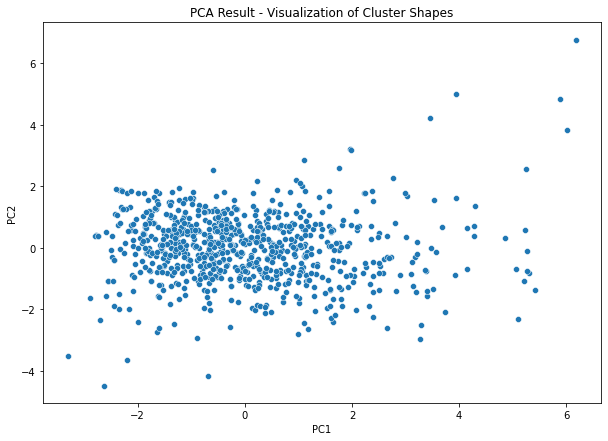

In [101]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# Apply PCA to reduce to 2 components for visualization
pca = PCA(n_components=2)
pca_result = pca.fit_transform(customer_data_scaled)

# Create a DataFrame for PCA results
pca_df = pd.DataFrame(pca_result, columns=['PC1', 'PC2'])

# Visualize the data in 2D
plt.figure(figsize=(10, 7))
sns.scatterplot(x='PC1', y='PC2', data=pca_df)
plt.title('PCA Result - Visualization of Cluster Shapes')
plt.show()


C:\Users\asus\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\Users\asus\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



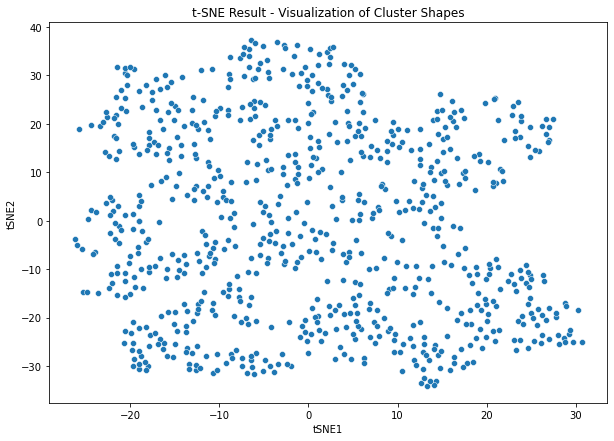

In [102]:
from sklearn.manifold import TSNE

# Apply t-SNE to reduce to 2 components for visualization
tsne = TSNE(n_components=2, random_state=42)
tsne_result = tsne.fit_transform(customer_data_scaled)

# Create a DataFrame for t-SNE results
tsne_df = pd.DataFrame(tsne_result, columns=['tSNE1', 'tSNE2'])

# Visualize the data in 2D
plt.figure(figsize=(10, 7))
sns.scatterplot(x='tSNE1', y='tSNE2', data=tsne_df)
plt.title('t-SNE Result - Visualization of Cluster Shapes')
plt.show()


In [105]:
from sklearn.cluster import DBSCAN

# Assuming customer_data_scaled is your scaled dataset
dbscan = DBSCAN(eps=0.5, min_samples=5)
customer_data['Cluster'] = dbscan.fit_predict(customer_data_scaled)

# Check if the 'Cluster' column has been added successfully
print(customer_data.head())  # Ensure 'Cluster' column exists

  Customer ID     Sales  Quantity    Profit  Discount  Number of Orders  \
0    AA-10315  5563.560        30 -362.8825  0.090909                11   
1    AA-10375  1056.390        41  277.3824  0.080000                15   
2    AA-10480  1790.512        36  435.8274  0.016667                12   
3    AA-10645  5086.935        64  857.8033  0.063889                18   
4    AB-10015   886.156        13  129.3465  0.066667                 6   

   Cluster  
0       -1  
1        0  
2        0  
3       -1  
4        0  


In [106]:
print(customer_data['Cluster'].unique())  # Check unique cluster labels
print(customer_data['Cluster'].dtype)     # Check data type

[-1  0  1  2]
int64


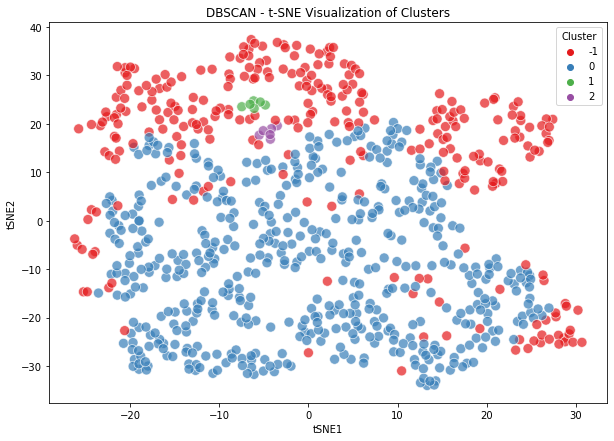

In [109]:
tsne_df['Cluster'] = customer_data['Cluster']

# Assuming 'Cluster' is in tsne_df
plt.figure(figsize=(10, 7))
sns.scatterplot(x='tSNE1', y='tSNE2', hue='Cluster', palette='Set1', data=tsne_df, s=100, alpha=0.7)
plt.title('DBSCAN - t-SNE Visualization of Clusters')
plt.show()


In [110]:
print(customer_data.columns)  # Check if 'Cluster' exists in your DataFrame


Index(['Customer ID', 'Sales', 'Quantity', 'Profit', 'Discount',
       'Number of Orders', 'Cluster'],
      dtype='object')


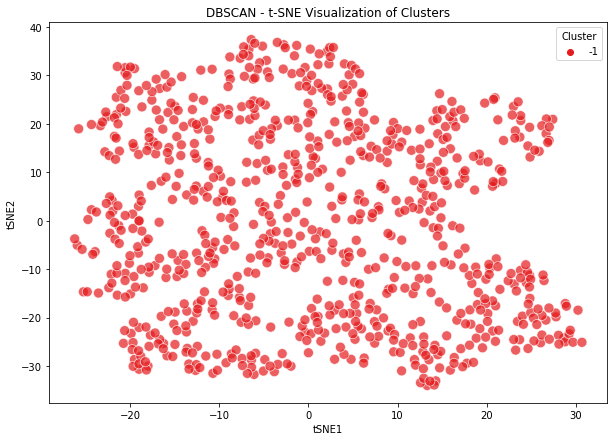

In [113]:
from sklearn.cluster import DBSCAN

# Try a smaller eps value to find more distinct clusters
dbscan = DBSCAN(eps=0.3, min_samples=10)
customer_data['Cluster'] = dbscan.fit_predict(customer_data_scaled)
tsne_df['Cluster'] = customer_data['Cluster']

# Revisualize the t-SNE output
plt.figure(figsize=(10, 7))
sns.scatterplot(x='tSNE1', y='tSNE2', hue='Cluster', palette='Set1', data=tsne_df, s=100, alpha=0.7)
plt.title('DBSCAN - t-SNE Visualization of Clusters')
plt.show()


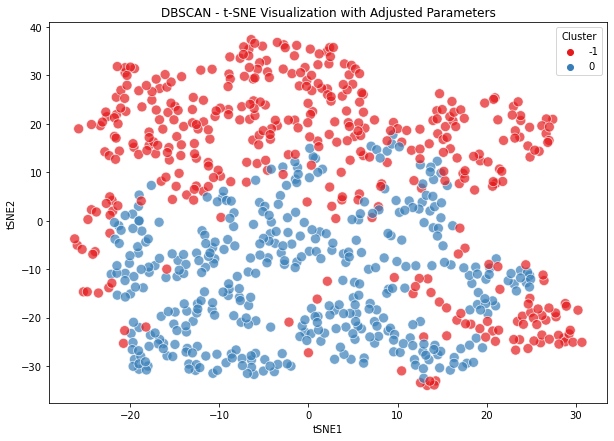

In [114]:
# Try a larger eps value
dbscan = DBSCAN(eps=0.5, min_samples=10)  # Increase eps
customer_data['Cluster'] = dbscan.fit_predict(customer_data_scaled)
tsne_df['Cluster'] = customer_data['Cluster']

# Visualize the updated clusters
plt.figure(figsize=(10, 7))
sns.scatterplot(x='tSNE1', y='tSNE2', hue='Cluster', palette='Set1', data=tsne_df, s=100, alpha=0.7)
plt.title('DBSCAN - t-SNE Visualization with Adjusted Parameters')
plt.show()


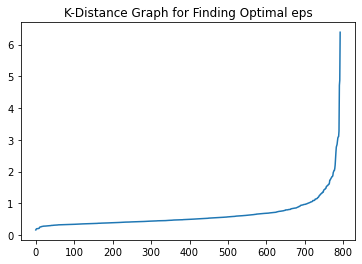

In [115]:
from sklearn.neighbors import NearestNeighbors
import numpy as np
import matplotlib.pyplot as plt

# Compute the nearest neighbors
neighbors = NearestNeighbors(n_neighbors=5)
neighbors_fit = neighbors.fit(customer_data_scaled)
distances, indices = neighbors_fit.kneighbors(customer_data_scaled)

# Sort distances for the k-distance graph
distances = np.sort(distances[:, 4], axis=0)  # 4th neighbor (k=5)
plt.plot(distances)
plt.title('K-Distance Graph for Finding Optimal eps')
plt.show()


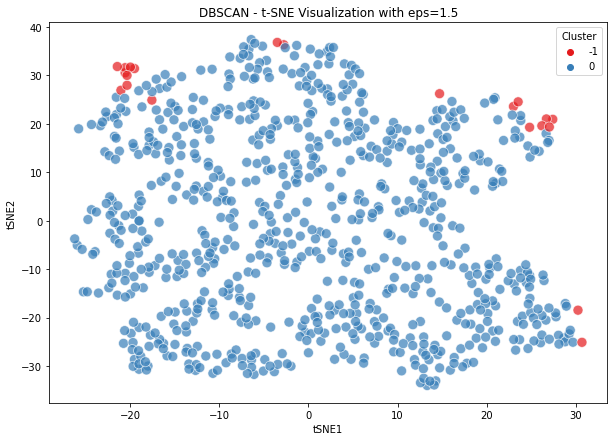

In [116]:
from sklearn.cluster import DBSCAN

# Apply DBSCAN with the chosen eps value from the elbow point
dbscan = DBSCAN(eps=1.5, min_samples=5)
customer_data['Cluster'] = dbscan.fit_predict(customer_data_scaled)
tsne_df['Cluster'] = customer_data['Cluster']

# Visualize the t-SNE plot
plt.figure(figsize=(10, 7))
sns.scatterplot(x='tSNE1', y='tSNE2', hue='Cluster', palette='Set1', data=tsne_df, s=100, alpha=0.7)
plt.title('DBSCAN - t-SNE Visualization with eps=1.5')
plt.show()


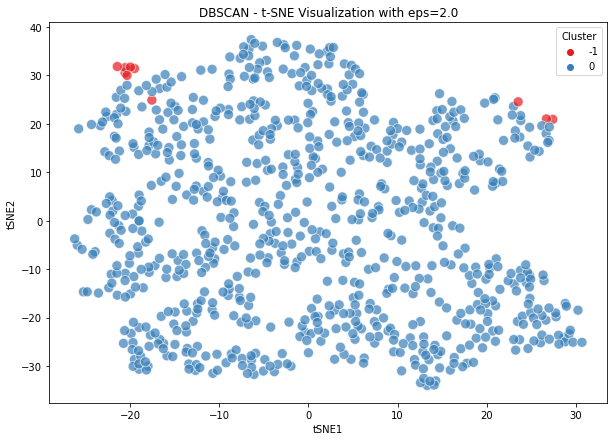

In [117]:
dbscan = DBSCAN(eps=2, min_samples=5)
customer_data['Cluster'] = dbscan.fit_predict(customer_data_scaled)
tsne_df['Cluster'] = customer_data['Cluster']

# Visualize the updated clusters
plt.figure(figsize=(10, 7))
sns.scatterplot(x='tSNE1', y='tSNE2', hue='Cluster', palette='Set1', data=tsne_df, s=100, alpha=0.7)
plt.title('DBSCAN - t-SNE Visualization with eps=2.0')
plt.show()


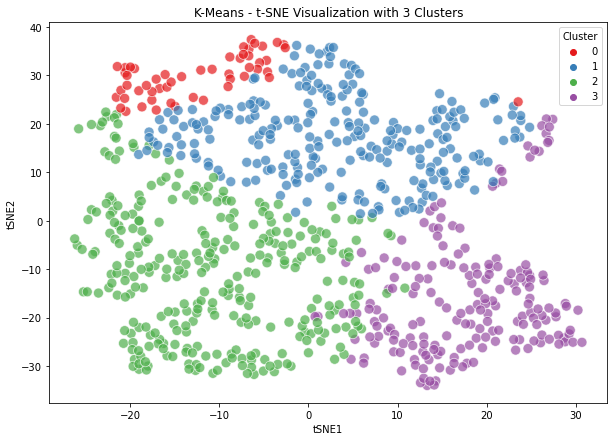

In [121]:
from sklearn.cluster import KMeans

# Apply K-Means clustering
kmeans = KMeans(n_clusters=4, random_state=42)
customer_data['Cluster'] = kmeans.fit_predict(customer_data_scaled)
tsne_df['Cluster'] = customer_data['Cluster']

# Visualize the clusters using t-SNE
plt.figure(figsize=(10, 7))
sns.scatterplot(x='tSNE1', y='tSNE2', hue='Cluster', palette='Set1', data=tsne_df, s=100, alpha=0.7)
plt.title('K-Means - t-SNE Visualization with 3 Clusters')
plt.show()


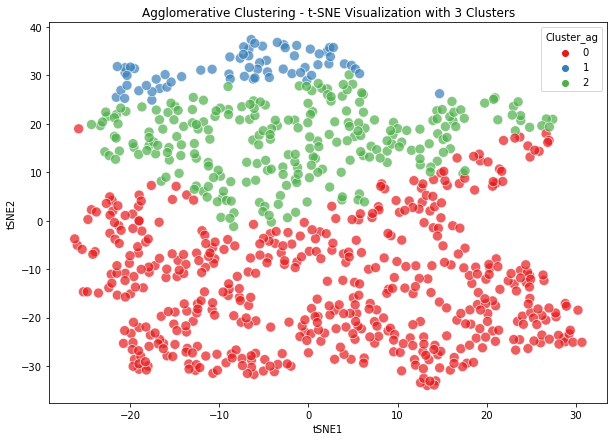

In [120]:
from sklearn.cluster import AgglomerativeClustering

# Apply Agglomerative Clustering
agglomerative = AgglomerativeClustering(n_clusters=3)
customer_data['Cluster_ag'] = agglomerative.fit_predict(customer_data_scaled)
tsne_df['Cluster_ag'] = customer_data['Cluster_ag']

# Visualize the clusters using t-SNE
plt.figure(figsize=(10, 7))
sns.scatterplot(x='tSNE1', y='tSNE2', hue='Cluster_ag', palette='Set1', data=tsne_df, s=100, alpha=0.7)
plt.title('Agglomerative Clustering - t-SNE Visualization with 3 Clusters')
plt.show()


C:\Users\asus\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.



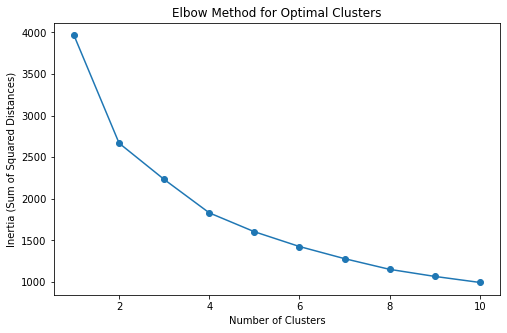

In [122]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Define range of cluster numbers to test
range_n_clusters = range(1, 11)

# Store inertia values for each number of clusters
inertia_values = []

for n_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(customer_data_scaled)
    inertia_values.append(kmeans.inertia_)

# Plot the inertia values
plt.figure(figsize=(8, 5))
plt.plot(range_n_clusters, inertia_values, marker='o')
plt.title('Elbow Method for Optimal Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia (Sum of Squared Distances)')
plt.show()


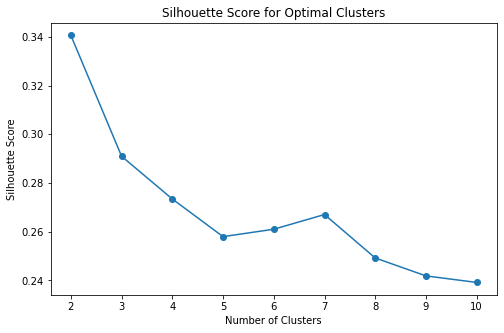

In [123]:
from sklearn.metrics import silhouette_score

# Define range of cluster numbers to test
range_n_clusters = range(2, 11)  # Silhouette score isn't meaningful for 1 cluster

silhouette_avg_values = []

for n_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(customer_data_scaled)
    silhouette_avg = silhouette_score(customer_data_scaled, cluster_labels)
    silhouette_avg_values.append(silhouette_avg)

# Plot silhouette score values
plt.figure(figsize=(8, 5))
plt.plot(range_n_clusters, silhouette_avg_values, marker='o')
plt.title('Silhouette Score for Optimal Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.show()


In [124]:
pip install gap-stat

  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Installing backend dependencies: started
  Installing backend dependencies: still running...
  Installing backend dependencies: finished with status 'done'
    Preparing wheel metadata: started
    Preparing wheel metadata: finished with status 'error'
Note: you may need to restart the kernel to use updated packages.


    ERROR: Command errored out with exit status 1:
     command: 'C:\Users\asus\anaconda3\python.exe' 'C:\Users\asus\anaconda3\lib\site-packages\pip\_vendor\pep517\in_process\_in_process.py' prepare_metadata_for_build_wheel 'C:\Users\asus\AppData\Local\Temp\tmpdjqatelh'
         cwd: C:\Users\asus\AppData\Local\Temp\pip-install-zh6bzlpf\gap-stat_951850facbee447eb2bf1c2120d51baa
    Complete output (53 lines):
    C:\Users\asus\AppData\Local\Temp\pip-build-env-lpvvihvy\overlay\Lib\site-packages\setuptools\_distutils\dist.py:261: UserWarning: Unknown distribution option: 'tests_require'
      warnings.warn(msg)
    C:\Users\asus\AppData\Local\Temp\pip-build-env-lpvvihvy\overlay\Lib\site-packages\setuptools\_distutils\dist.py:261: UserWarning: Unknown distribution option: 'test_suite'
      warnings.warn(msg)
    running dist_info
    creating C:\Users\asus\AppData\Local\Temp\pip-modern-metadata-qh5nx49q\gap_stat.egg-info
    writing C:\Users\asus\AppData\Local\Temp\pip-modern-metadata-qh

In [125]:
from gap_statistic import OptimalK

# Using the OptimalK function to determine the number of clusters
optimalK = OptimalK(parallel_backend='joblib')
n_clusters = optimalK(customer_data_scaled, cluster_array=np.arange(1, 11))

print(f'Optimal number of clusters based on gap statistic: {n_clusters}')


Optimal number of clusters based on gap statistic: 1


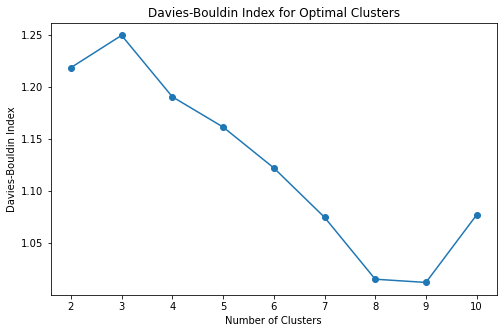

In [126]:
from sklearn.metrics import davies_bouldin_score

# Define range of cluster numbers to test
range_n_clusters = range(2, 11)

davies_bouldin_values = []

for n_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(customer_data_scaled)
    db_score = davies_bouldin_score(customer_data_scaled, cluster_labels)
    davies_bouldin_values.append(db_score)

# Plot Davies-Bouldin values
plt.figure(figsize=(8, 5))
plt.plot(range_n_clusters, davies_bouldin_values, marker='o')
plt.title('Davies-Bouldin Index for Optimal Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Davies-Bouldin Index')
plt.show()


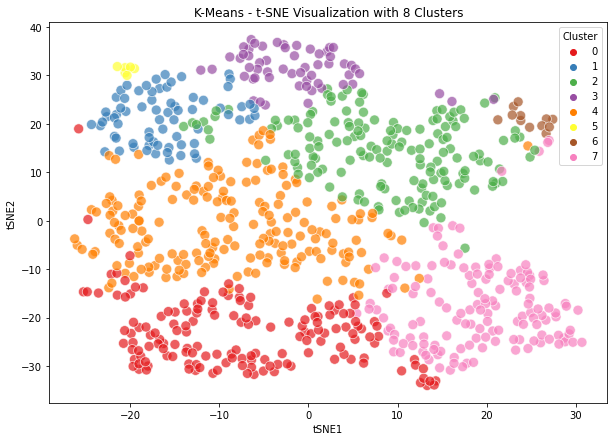

In [130]:
kmeans = KMeans(n_clusters=8, random_state=42)
customer_data['Cluster'] = kmeans.fit_predict(customer_data_scaled)
tsne_df['Cluster'] = customer_data['Cluster']


# Visualize the clusters using t-SNE
plt.figure(figsize=(10, 7))
sns.scatterplot(x='tSNE1', y='tSNE2', hue='Cluster', palette='Set1', data=tsne_df, s=100, alpha=0.7)
plt.title('K-Means - t-SNE Visualization with 8 Clusters')
plt.show()


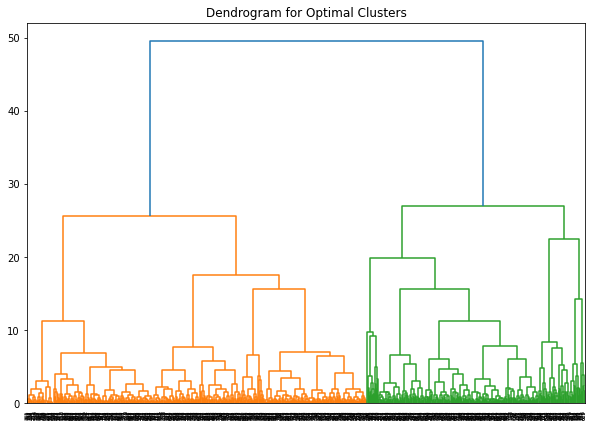

In [128]:
from scipy.cluster.hierarchy import dendrogram, linkage

# Perform hierarchical clustering
Z = linkage(customer_data_scaled, method='ward')

# Plot the dendrogram
plt.figure(figsize=(10, 7))
dendrogram(Z)
plt.title('Dendrogram for Optimal Clusters')
plt.show()


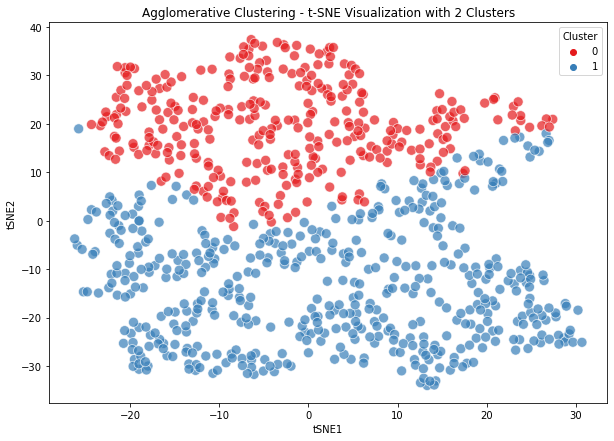

In [131]:
from sklearn.cluster import AgglomerativeClustering

# Apply Agglomerative Clustering with 2 clusters
agg_clustering = AgglomerativeClustering(n_clusters=2)
customer_data['Cluster'] = agg_clustering.fit_predict(customer_data_scaled)
tsne_df['Cluster'] = customer_data['Cluster']


# Visualize the clusters using t-SNE
plt.figure(figsize=(10, 7))
sns.scatterplot(x='tSNE1', y='tSNE2', hue='Cluster', palette='Set1', data=tsne_df, s=100, alpha=0.7)
plt.title('Agglomerative Clustering - t-SNE Visualization with 2 Clusters')
plt.show()


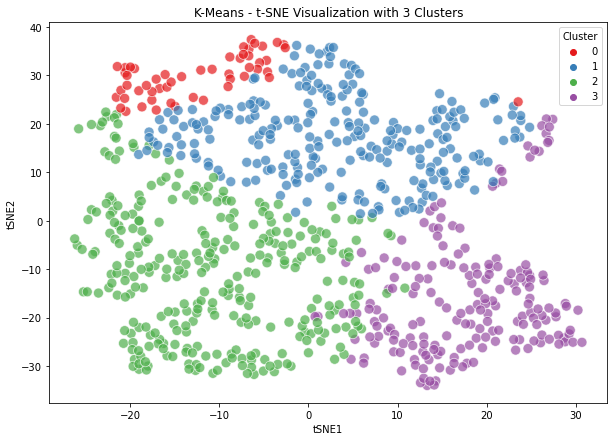

In [132]:
from sklearn.cluster import KMeans

# Apply K-Means clustering
kmeans = KMeans(n_clusters=4, random_state=42)
customer_data['Cluster'] = kmeans.fit_predict(customer_data_scaled)
tsne_df['Cluster'] = customer_data['Cluster']

# Visualize the clusters using t-SNE
plt.figure(figsize=(10, 7))
sns.scatterplot(x='tSNE1', y='tSNE2', hue='Cluster', palette='Set1', data=tsne_df, s=100, alpha=0.7)
plt.title('K-Means - t-SNE Visualization with 3 Clusters')
plt.show()

In [133]:
# Group by cluster and calculate the average of each feature
cluster_analysis = customer_data.groupby('Cluster').mean()
print(cluster_analysis)


               Sales   Quantity       Profit  Discount  Number of Orders  \
Cluster                                                                    
0        9693.227138  77.320755  2291.741053  0.121936         19.830189   
1        3731.191227  71.559184   320.389821  0.165029         18.534694   
2        1879.993091  33.849673   346.233629  0.094820          9.232026   
3        1555.767649  31.137566  -103.218258  0.259118          8.343915   

         Cluster_ag  
Cluster              
0          1.188679  
1          1.612245  
2          0.287582  
3          0.042328  


In [134]:
customer_data.drop(columns=['Cluster_ag'], inplace=True)


In [135]:
# Group by cluster and calculate the average of each feature
cluster_analysis = customer_data.groupby('Cluster').mean()
print(cluster_analysis)

               Sales   Quantity       Profit  Discount  Number of Orders
Cluster                                                                 
0        9693.227138  77.320755  2291.741053  0.121936         19.830189
1        3731.191227  71.559184   320.389821  0.165029         18.534694
2        1879.993091  33.849673   346.233629  0.094820          9.232026
3        1555.767649  31.137566  -103.218258  0.259118          8.343915


In [136]:
# Create a dictionary to map cluster numbers to descriptive names
cluster_names = {
    0: 'High-Value Customers',
    1: 'Frequent Buyers',
    2: 'Moderate Buyers',
    3: 'Discount-Driven Low Profit'
}

# Apply the cluster names to the customer data
customer_data['Cluster Name'] = customer_data['Cluster'].map(cluster_names)

# View the first few rows with cluster names
customer_data[['Customer ID', 'Cluster', 'Cluster Name']].head()


,Customer ID,Cluster,Cluster Name
0,AA-10315,2,Moderate Buyers
1,AA-10375,2,Moderate Buyers
2,AA-10480,2,Moderate Buyers
3,AA-10645,1,Frequent Buyers
4,AB-10015,2,Moderate Buyers


In [137]:
# Count the number of customers in each cluster
cluster_size = customer_data['Cluster Name'].value_counts()
print(cluster_size)


Moderate Buyers               306
Frequent Buyers               245
Discount-Driven Low Profit    189
High-Value Customers           53
Name: Cluster Name, dtype: int64


In [138]:
# Calculate the total sales per cluster
sales_per_cluster = customer_data.groupby('Cluster Name')['Sales'].sum()
print(sales_per_cluster)

# Calculate the total profit per cluster
profit_per_cluster = customer_data.groupby('Cluster Name')['Profit'].sum()
print(profit_per_cluster)


Cluster Name
Discount-Driven Low Profit    294040.0857
Frequent Buyers               914141.8505
High-Value Customers          513741.0383
Moderate Buyers               575277.8858
Name: Sales, dtype: float64
Cluster Name
Discount-Driven Low Profit    -19508.2507
Frequent Buyers                78495.5061
High-Value Customers          121462.2758
Moderate Buyers               105947.4905
Name: Profit, dtype: float64


In [139]:
import plotly.express as px

# Pie chart for cluster distribution
fig = px.pie(customer_data, names='Cluster Name', title='Customer Segment Distribution')
fig.show()


In [140]:
# Bar chart for sales by cluster
fig = px.bar(customer_data.groupby('Cluster Name')['Sales'].sum().reset_index(), 
             x='Cluster Name', y='Sales', title='Total Sales by Customer Segment')
fig.show()


In [141]:
# Bar chart for total profit by cluster
fig = px.bar(customer_data.groupby('Cluster Name')['Profit'].sum().reset_index(), 
             x='Cluster Name', y='Profit', title='Total Profit by Customer Segment',
             labels={'Profit': 'Total Profit', 'Cluster Name': 'Customer Segment'})

# Show the plot
fig.show()


In [142]:
# Aggregate metrics by cluster name
cluster_summary = customer_data.groupby('Cluster Name').agg({
    'Sales': 'sum',
    'Profit': 'sum',
    'Discount': 'mean',  # Average discount per cluster
    'Customer ID': 'count'  # Cluster size (number of customers in each cluster)
}).reset_index()

# Rename 'Customer ID' to 'Cluster Size'
cluster_summary.rename(columns={'Customer ID': 'Cluster Size'}, inplace=True)

# View the summarized data
print(cluster_summary)


                 Cluster Name        Sales       Profit  Discount  \
0  Discount-Driven Low Profit  294040.0857  -19508.2507  0.259118   
1             Frequent Buyers  914141.8505   78495.5061  0.165029   
2        High-Value Customers  513741.0383  121462.2758  0.121936   
3             Moderate Buyers  575277.8858  105947.4905  0.094820   

   Cluster Size  
0           189  
1           245  
2            53  
3           306  
